 # Example 2 (Negative Feedback)

## Packages

In [15]:
using IntervalArithmetic, Plots, LaTeXStrings

In [3]:
#plotly() # for zoom
gr() # to export

Plots.GRBackend()

# Algorithm 4F [Subdivision + Contraction + Filter]

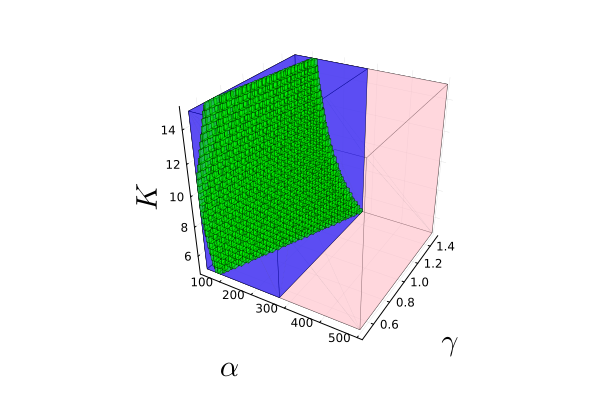

Solution may exist.


In [ ]:
begin
    
    f(x, α, γ, k) = α/(1 + x/k) - γ*x;
    
    # Desired steady state interval
    local Xd = Interval(26, 28);

    # Initial parameter sets
    local A0 = Interval(50, 500);
    local Γ0 = Interval(0.5, 1.5);
    local K0 = Interval(5, 15);

    
    # Initialize variables
    local A1, Γ1, K1;
    local b0, c0, d0, e0, y;
    local b1, c1, d1, e1;
    
    # Initial box
    local P0 = IntervalBox(A0, Γ0, K0);
    
    # Initialize plot
    local plt = plot(xlabel=L"\alpha", ylabel=L"\gamma", zlabel=L"K", tickfontsize=8, guidefontsize=20);
    plt = plot3D(P0..., "pink");

    # Initialize solution variable
    Solution1 = [];
    
    # Specify tolerance
    local tolerance = 0.001;
        
    # Forward Backward Contractor
    b0 = Γ0*Xd;
    c0 = Xd/K0;
    d0 = 1 + c0;
    e0 = A0/d0;
    y = e0 - b0;
    
    y = y ∩ (0..0);
    
    # Store originals
    b1, c1, d1, e1 = b0, c0, d0, e0;
    
    e1 = (b0 + y) ∩ e0;
    b1 = (e0 - y) ∩ b0;
    A1 = (e1 * d0) ∩ A0;
    d1 = (A0 / e1) ∩ d0;
    c1 = (d1 - 1) ∩ c0;
    K1 = (Xd / c1) ∩ K0;
    Γ1 = (b1 / Xd) ∩ Γ0;
    
    # Box at first iteration
    local P1 = IntervalBox(A1, Γ1, K1);
    
    # Plot
    plt = plot3D(P1..., "blue");
    
    # A stronger non-existence condition
    if isempty(P1)
       println("Solution does not exist.");
    else
        println("Solution may exist.");
    
    
        # Parameter subdivided, m times in each direction
        local m = 25;
        local P1m = mince(P1, m);
        local A0m, Γ0m, K0m;
        local A1m, Γ1m, K1m;
        local b0m, c0m, d0m, e0m, ym;
        local b1m, c1m, d1m, e1m;
        local Pold, Pnew;

        # Using a bisection like condition to rule out grids
        local Pfilter = filter(Pf -> (0 ∈ f(Xd × Pf...)), P1m);

        for i in 1:length(Pfilter)

            A0m, Γ0m, K0m = Pfilter[i];

            Pold = Pfilter[i];

            while true # volume after the iteration breaks the loop 

                # Contractor

                # Forward Propagation
                b0m = Γ0m*Xd;
                c0m = Xd/K0m;
                d0m = 1 + c0m;
                e0m = A0m/d0m;
                ym = e0m - b0m;

                # Constraint
                ym = ym ∩ (0..0);

                # Backward Propagation

                # Store originals
                b1m, c1m, d1m, e1m = b0m, c0m, d0m, e0m;

                e1m = (b0m + ym) ∩ e0m;
                b1m = (e0m - y) ∩ b0m;
                A1m = (e1m * d0m) ∩ A0m;
                d1m = (A0m / e1m) ∩ d0m;
                c1m = (d1m - 1) ∩ c0m;
                K1m = (Xd / c1m) ∩ K0m;
                Γ1m = (b1m / Xd) ∩ Γ0m;

                Pnew = IntervalBox(A1m, Γ1m, K1m);

                # Break if there is not much change in the volume of P
                if prod(diam.(Pnew))/prod(diam.(Pold)) > 1 - tolerance

                    # Plot
                    plt = plot3D(Pnew..., "lime");

                    push!(Solution1, Pnew); # save

                    break;

                end


                Pold = Pnew;

            end

        end

        display(plt);

        # savefig(plt, "Ex2_CSF.pdf");

    end
    
end

*A function to plot in 3D*

In [ ]:
function plot3D(A, B, C, clr::String)
# A, B, C are the intervals in the three directions.
    
    #@show clr
    
    # These are the vertices of the cube
    xp = [A.lo, A.lo, A.lo, A.lo, A.hi, A.hi, A.hi, A.hi]
    yp = [B.lo, B.hi, B.lo, B.hi, B.lo, B.lo, B.hi, B.hi]
    zp = [C.lo, C.lo, C.hi, C.hi, C.hi, C.lo, C.lo, C.hi]
    
    # These are their connections
    connections = [(1,2,3), (4,2,3), (4,7,8), (7,5,6), (2,4,7), (1,6,2), (2,7,6), (7,8,5), (4,8,5), (4,5,3), (1,6,3), (6,3,5)]

    # Edges
    xe = [A.lo, A.hi, A.hi, A.lo, A.lo, A.lo, A.lo, A.lo, A.lo, A.lo, A.hi, A.hi, A.hi, A.hi, A.hi, A.hi, A.lo]
    ye = [B.lo, B.lo, B.lo, B.lo, B.lo, B.hi, B.hi, B.lo, B.lo, B.hi, B.hi, B.lo, B.hi, B.hi, B.lo, B.hi, B.hi]
    ze = [C.lo, C.lo, C.hi, C.hi, C.lo, C.lo, C.hi, C.hi, C.lo, C.lo, C.lo, C.lo, C.lo, C.hi, C.hi, C.hi, C.hi]

    plot!(xe, ye, ze; lc=:black, lw=0.5, label=false)
    mesh3d!(xp, yp, zp; connections, proj_type=:persp, lc=:black, fc=clr, fa=0.4, lw=0, label=false);

end

plot3D (generic function with 1 method)